In [ ]:
import tensorflow as tf
from PIL import Image
import numpy as np
import os
import pathlib
import time
import datetime

from matplotlib import pyplot as plt
from IPython import display

In [ ]:
from google.colab import drive
drive.mount("/content/drive")

Mounted at /content/drive


In [ ]:
!apt-get install unrar
!pip install rarfile

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
unrar is already the newest version (1:6.1.5-1).
0 upgraded, 0 newly installed, 0 to remove and 49 not upgraded.


In [ ]:
!ls "/content/drive/MyDrive"


'AI Practitioner Project Proposal.pptx'
 certificates.pdf
 Classroom
'Colab Notebooks'
'ELC2242 10- Sedra Ch 10 Frequency Response S22.gslides'
 model.rar
'Omar AbdelBar - bank-full.gsheet'
'Omar Emad (2).pdf'
'Omar Emad - second point slide 14.aac'
'Omar Emad - slide 13+first point slide 14.aac'
 Teams.gsheet
'thermodynamics (3).pdf'
'Untitled document (1).gdoc'
'Untitled document (2).gdoc'
'Untitled document (3).gdoc'
'Untitled document.gdoc'


In [ ]:
# Path to the .rar file
rar_file_path = "/content/drive/MyDrive/model.rar"

# Destination folder for extracted files
extract_to = "/content/myData"

# Ensure the destination directory exists
os.makedirs(extract_to, exist_ok=True)

# Extract using unrar
!unrar x -r {rar_file_path} {extract_to}


UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/drive/MyDrive/model.rar

Creating    /content/myData/model                                     OK
Creating    /content/myData/model/inp                                 OK
Extracting  /content/myData/model/inp/EMIDEC_Case_N006_slice_1_NoInf_NoReflowN.tif       0%  OK 
Extracting  /content/myData/model/inp/EMIDEC_Case_N006_slice_2_NoInf_NoReflowN.tif       0%  OK 
Extracting  /content/myData/model/inp/EMIDEC_Case_N006_slice_3_NoInf_NoReflowN.tif       0%  OK 
Extracting  /content/myData/model/inp/EMIDEC_Case_N006_slice_4_NoInf_NoReflowN.tif       0%  OK 
Extracting  /content/myData/model/inp/EMIDEC_Case_N006_slice_5_NoInf_NoReflowN.tif       0%  OK 
Extracting  /content/myData/model/inp/EMIDEC_Case_N006_slice_6_NoInf_NoReflowN.tif       0%  OK 
Extracting  /content/myData/model/inp/EMIDEC_Case_N006_slice_7_NoInf_NoReflowN.tif      

In [ ]:
from PIL import Image
import os

# Path to the images directory
images_path = "/content/myData/model/tar"

# List all files in the images directory
image_files = sorted(os.listdir(images_path))

# Open the first image
first_image_path = os.path.join(images_path, image_files[0])
image = Image.open(first_image_path)

# Print the shape (width, height) and number of channels
print("Image size (width, height):", image.size)  # (width, height)
print("Number of channels:", len(image.getbands()))  # Number of channels


Image size (width, height): (128, 128)
Number of channels: 1


In [ ]:
  # Paths to the images and masks directories
images_path = "/content/myData/model/tar"
masks_path = "/content/myData/model/inp"

# List and sort files to ensure they match
image_files = sorted(os.listdir(images_path))
mask_files = sorted(os.listdir(masks_path))

In [ ]:
# Function to load a single `.tif` file and convert it to a TensorFlow tensor
def load_tif_image(image_path):
    # Open the image using PIL
    image = Image.open(image_path)
    # Convert to NumPy array
    image_array = np.array(image, dtype=np.float32)  # Keep original pixel values
    # Expand dimensions for TensorFlow compatibility (H, W) -> (H, W, 1)
    image_array = np.expand_dims(image_array, axis=-1)
    # Convert to TensorFlow tensor
    image_tensor = tf.convert_to_tensor(image_array, dtype=tf.float32)
    return image_tensor

In [ ]:
# Function to load all images and masks
def load_dataset(images_path, masks_path):
    images = []
    masks = []
    for img_file, mask_file in zip(image_files, mask_files):
        # Full paths
        img_path = os.path.join(images_path, img_file)
        mask_path = os.path.join(masks_path, mask_file)

        # Load images and masks
        img = load_tif_image(img_path)
        mask = load_tif_image(mask_path)

        # Append to lists
        images.append(img)
        masks.append(mask)

    # Convert lists to tensors
    images = tf.stack(images)  # Shape: (N, H, W, 1)
    masks = tf.stack(masks)  # Shape: (N, H, W, 1)
    return images, masks

In [ ]:
import os
import tensorflow as tf
from tensorflow.keras.preprocessing import image
import numpy as np

In [ ]:
# Load dataset
images_tensor, masks_tensor = load_dataset(images_path, masks_path)

# Check shapes
print(f"Images Tensor Shape: {images_tensor.shape}, dtype: {images_tensor.dtype}")
print(f"Masks Tensor Shape: {masks_tensor.shape}, dtype: {masks_tensor.dtype}")

Images Tensor Shape: (810, 128, 128, 1), dtype: <dtype: 'float32'>
Masks Tensor Shape: (810, 128, 128, 1), dtype: <dtype: 'float32'>


In [ ]:
images_tensor = images_tensor[:500]
masks_tensor = masks_tensor[:500]

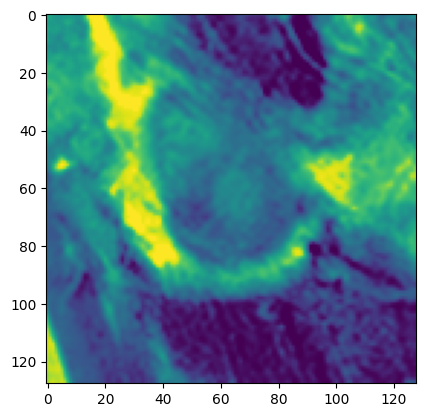

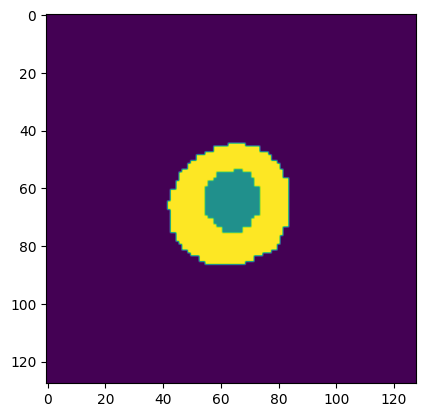

In [ ]:
re = images_tensor[10]
inp = masks_tensor[10]
# Casting to int for matplotlib to display the images
plt.figure()
plt.imshow(re/255.0)
plt.figure()
plt.imshow(inp/255.0)

In [ ]:
# Assuming 'image' is a NumPy array
print(f"Image value range: min={np.min(re/255)}, max={np.max(re/255)}")

Image value range: min=0.0, max=1.0


In [ ]:
# The facade training set consist of 400 images
BUFFER_SIZE = 500
# The batch size of 1 produced better results for the U-Net in the original pix2pix experiment
BATCH_SIZE = 1
# Each image is 256x256 in size
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [ ]:
def resize(input_image, real_image, height, width):
  input_image = tf.image.resize(input_image, [height, width],
                                method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)
  real_image = tf.image.resize(real_image, [height, width],
                               method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  return input_image, real_image

In [ ]:
def random_crop(input_image, real_image):
  stacked_image = tf.stack([input_image, real_image], axis=0)
  cropped_image = tf.image.random_crop(
      stacked_image, size=[2, IMG_HEIGHT, IMG_WIDTH, 1])

  return cropped_image[0], cropped_image[1]

In [ ]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

In [ ]:
@tf.function()
def random_jitter(input_image, real_image):
  # Resizing to 286x286
  input_image, real_image = resize(input_image, real_image, 286, 286)

  # Random cropping back to 256x256
  input_image, real_image = random_crop(input_image, real_image)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = tf.image.flip_left_right(input_image)
    real_image = tf.image.flip_left_right(real_image)

  return input_image, real_image

In [ ]:
print(f"Input shape: {inp.shape}, dtype: {inp.dtype}")
print(f"Reference shape: {re.shape}, dtype: {re.dtype}")

Input shape: (128, 128, 1), dtype: <dtype: 'float32'>
Reference shape: (128, 128, 1), dtype: <dtype: 'float32'>


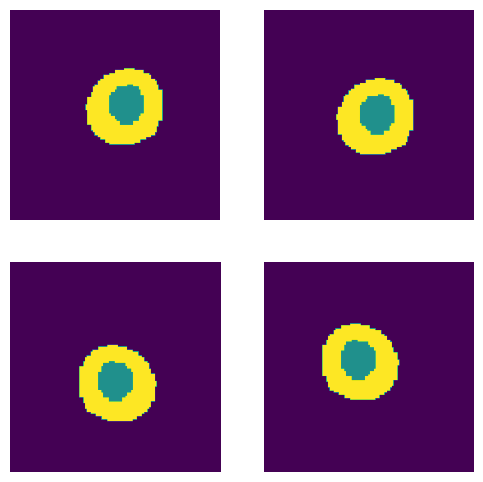

In [ ]:
plt.figure(figsize=(6, 6))
for i in range(4):
  rj_inp, rj_re = random_jitter(inp, re)
  plt.subplot(2, 2, i + 1)
  plt.imshow(rj_inp / 255.0 )
  plt.axis('off')
plt.show()

In [ ]:
# Assuming resized_images and resized_masks are tensors
# Both should have the same first dimension (number of samples)
num_samples = images_tensor.shape[0]
num_samples = images_tensor.shape[0]

print(num_samples)

# Define split ratio (e.g., 90% train, 10% test)
train_ratio = 0.9
train_size = int(train_ratio * num_samples)

# Shuffle the data (optional but recommended)
indices = tf.range(num_samples)
shuffled_indices = tf.random.shuffle(indices)

shuffled_images = tf.gather(images_tensor, shuffled_indices)
shuffled_masks = tf.gather(masks_tensor, shuffled_indices)

# Split into training and testing datasets
train_images = shuffled_images[:train_size]
train_masks = shuffled_masks[:train_size]
train_images, train_masks = resize(train_images, train_masks,256,256)
train_images, train_masks = normalize(train_images, train_masks)

test_images = shuffled_images[train_size:]
test_masks = shuffled_masks[train_size:]
test_images, test_masks = resize(test_images, test_masks,256,256)
test_images, test_masks = normalize(test_images, test_masks)

# Create tf.data.Dataset objects for training and testing
train_dataset = tf.data.Dataset.from_tensor_slices((train_masks, train_images))
test_dataset = tf.data.Dataset.from_tensor_slices((test_masks, test_images))

# Optional: Batch the datasets
train_dataset = train_dataset.batch(BATCH_SIZE).shuffle(buffer_size=100).prefetch(tf.data.AUTOTUNE)
test_dataset = test_dataset.batch(BATCH_SIZE).prefetch(tf.data.AUTOTUNE)

# Print dataset sizes
print(f"Train dataset size: {len(train_images)}")
print(f"Test dataset size: {len(test_images)}")


500
Train dataset size: 450
Test dataset size: 50


In [ ]:
re = train_images[10]
inp = train_masks[10]

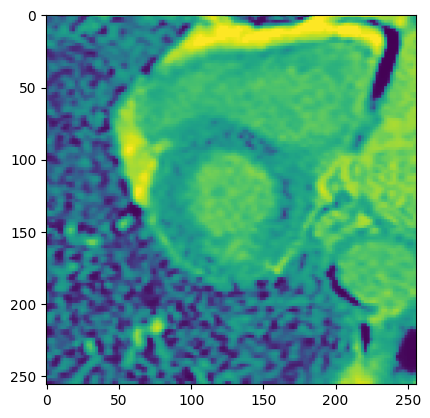

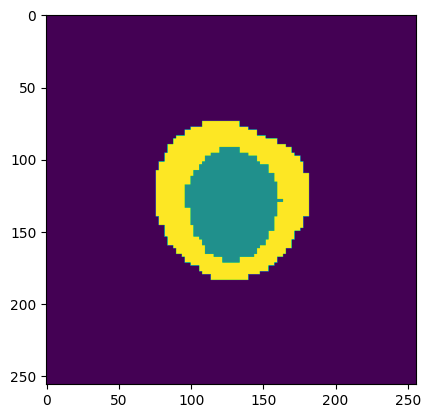

In [ ]:
plt.figure()
plt.imshow(re/255.0)
plt.figure()
plt.imshow(inp/255.0)

In [ ]:
OUTPUT_CHANNELS = 1

In [ ]:
def downsample(filters, size, apply_batchnorm=True):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
      tf.keras.layers.Conv2D(filters, size, strides=2, padding='same',
                             kernel_initializer=initializer, use_bias=False))

  if apply_batchnorm:
    result.add(tf.keras.layers.BatchNormalization())

  result.add(tf.keras.layers.LeakyReLU())

  return result

In [ ]:
down_model = downsample(3, 4)
down_result = down_model(tf.expand_dims(inp, 0))
print (down_result.shape)

(1, 128, 128, 3)


In [ ]:
def upsample(filters, size, apply_dropout=False):
  initializer = tf.random_normal_initializer(0., 0.02)

  result = tf.keras.Sequential()
  result.add(
    tf.keras.layers.Conv2DTranspose(filters, size, strides=2,
                                    padding='same',
                                    kernel_initializer=initializer,
                                    use_bias=False))

  result.add(tf.keras.layers.BatchNormalization())

  if apply_dropout:
      result.add(tf.keras.layers.Dropout(0.5))

  result.add(tf.keras.layers.ReLU())

  return result

In [ ]:
up_model = upsample(3, 4)
up_result = up_model(down_result)
print (up_result.shape)

(1, 256, 256, 3)


In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[256, 256, 1])

  down_stack = [
    downsample(64, 4, apply_batchnorm=False),  # (batch_size, 128, 128, 64)
    downsample(128, 4),  # (batch_size, 64, 64, 128)
    downsample(256, 4),  # (batch_size, 32, 32, 256)
    downsample(512, 4),  # (batch_size, 16, 16, 512)
    downsample(512, 4),  # (batch_size, 8, 8, 512)
    downsample(512, 4),  # (batch_size, 4, 4, 512)
    downsample(512, 4),  # (batch_size, 2, 2, 512)
    downsample(512, 4),  # (batch_size, 1, 1, 512)
  ]

  up_stack = [
    upsample(512, 4, apply_dropout=True),  # (batch_size, 2, 2, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 4, 4, 1024)
    upsample(512, 4, apply_dropout=True),  # (batch_size, 8, 8, 1024)
    upsample(512, 4),  # (batch_size, 16, 16, 1024)
    upsample(256, 4),  # (batch_size, 32, 32, 512)
    upsample(128, 4),  # (batch_size, 64, 64, 256)
    upsample(64, 4),  # (batch_size, 128, 128, 128)
  ]

  initializer = tf.random_normal_initializer(0., 0.02)
  last = tf.keras.layers.Conv2DTranspose(OUTPUT_CHANNELS, 4,
                                         strides=2,
                                         padding='same',
                                         kernel_initializer=initializer,
                                         activation='tanh')  # (batch_size, 256, 256, 1)

  x = inputs

  # Downsampling through the model
  skips = []
  for down in down_stack:
    x = down(x)
    skips.append(x)

  skips = reversed(skips[:-1])

  # Upsampling and establishing the skip connections
  for up, skip in zip(up_stack, skips):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])

  x = last(x)

  return tf.keras.Model(inputs=inputs, outputs=x)

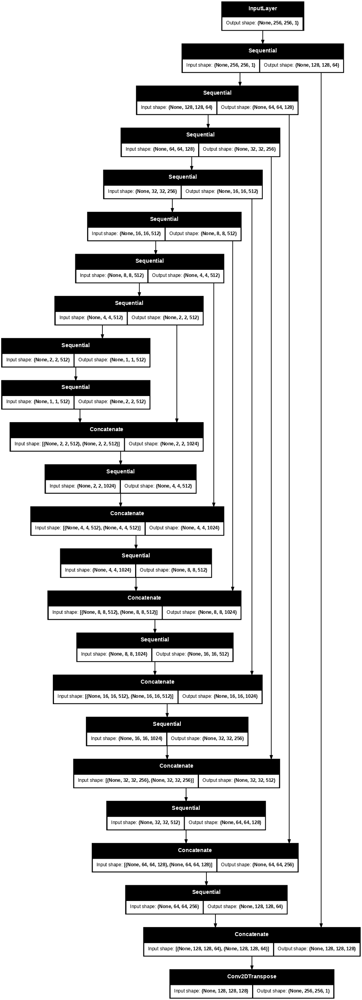

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

(1, 256, 256, 1)


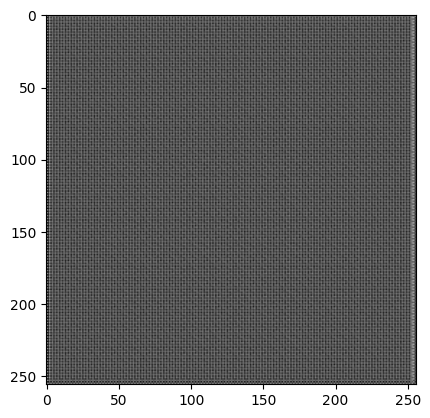

In [ ]:
gen_output = generator(inp[tf.newaxis, ...], training=False)
print(gen_output.shape)
plt.imshow(gen_output[0, ...],cmap="gray")

In [ ]:
LAMBDA = 100

In [ ]:
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output)

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

In [ ]:
def Discriminator():
  initializer = tf.random_normal_initializer(0., 0.02)

  inp = tf.keras.layers.Input(shape=[256, 256, 1], name='input_image')
  tar = tf.keras.layers.Input(shape=[256, 256, 1], name='target_image')

  x = tf.keras.layers.concatenate([inp, tar])  # (batch_size, 256, 256, channels*2)

  down1 = downsample(64, 4, False)(x)  # (batch_size, 128, 128, 64)
  down2 = downsample(128, 4)(down1)  # (batch_size, 64, 64, 128)
  down3 = downsample(256, 4)(down2)  # (batch_size, 32, 32, 256)

  zero_pad1 = tf.keras.layers.ZeroPadding2D()(down3)  # (batch_size, 34, 34, 256)
  conv = tf.keras.layers.Conv2D(512, 4, strides=1,
                                kernel_initializer=initializer,
                                use_bias=False)(zero_pad1)  # (batch_size, 31, 31, 512)

  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)

  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  zero_pad2 = tf.keras.layers.ZeroPadding2D()(leaky_relu)  # (batch_size, 33, 33, 512)

  last = tf.keras.layers.Conv2D(1, 4, strides=1,
                                kernel_initializer=initializer)(zero_pad2)  # (batch_size, 30, 30, 1)

  return tf.keras.Model(inputs=[inp, tar], outputs=last)

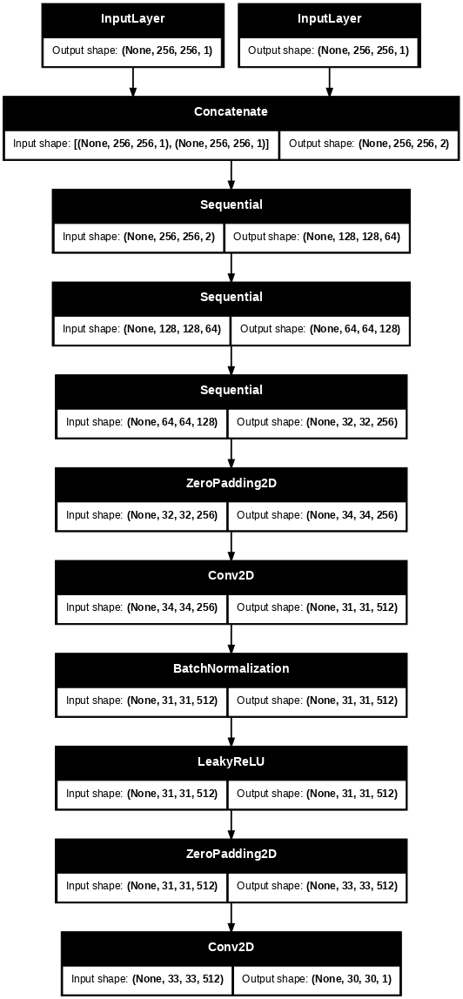

In [ ]:
discriminator = Discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

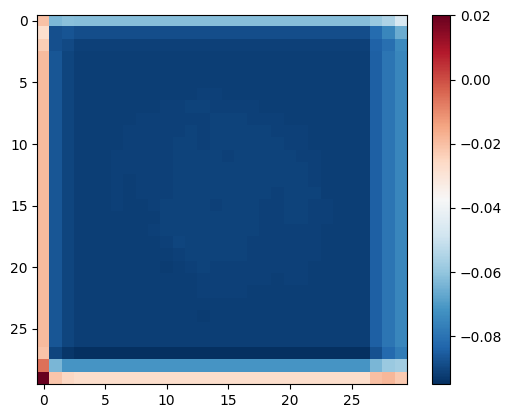

In [ ]:
disc_out = discriminator([inp[tf.newaxis, ...], gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], cmap='RdBu_r')
plt.colorbar()

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [ ]:
checkpoint_dir = '/content/myData/training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
# Create the directory if it doesn't exist and print the status
if not os.path.exists(checkpoint_dir):
    os.makedirs(checkpoint_dir)
    print(f"Directory {checkpoint_dir} was created.")
else:
    print(f"Directory {checkpoint_dir} already exists.")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

Directory /content/myData/training_checkpoints already exists.


In [ ]:
def generate_images(model, test_input, tar):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))

  display_list = [test_input[0], tar[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i in range(3):
    plt.subplot(1, 3, i+1)
    plt.title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    print(f"Image value range: min={np.min(display_list[i])}, max={np.max(display_list[i])}")
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

Image value range: min=-1.0, max=-0.9843137264251709
Image value range: min=-1.0, max=1.0
Image value range: min=-0.8408522605895996, max=0.9650823473930359


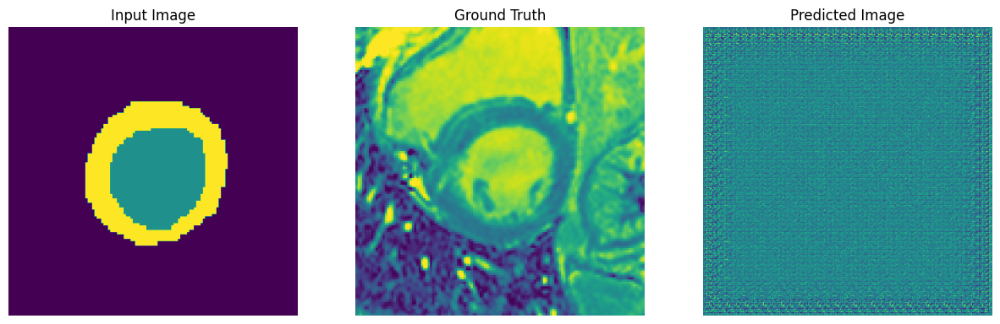

Image value range: min=-1.0, max=-0.9843137264251709
Image value range: min=-1.0, max=1.0
Image value range: min=-0.8249749541282654, max=0.9693335294723511


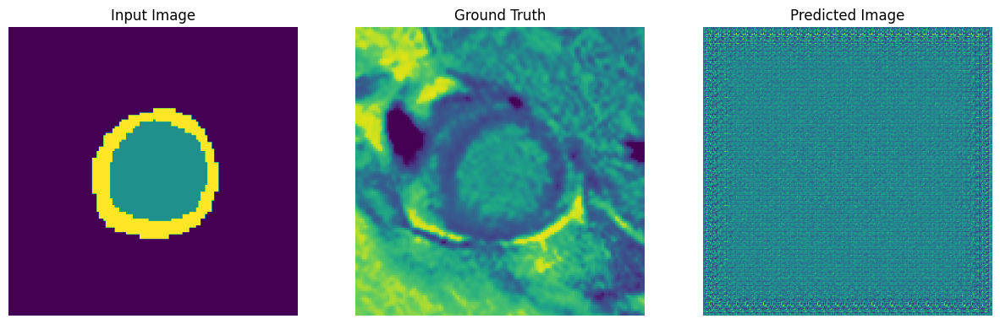

In [ ]:
for example_input, example_target in test_dataset.take(2):
  generate_images(generator, example_input, example_target)

In [ ]:
log_dir="/content/myData/logs/"

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))

In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))

  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      generate_images(generator, example_input, example_target)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)


    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

Time taken for 1000 steps: 114.19 sec

Image value range: min=-1.0, max=-0.9843137264251709
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9956934452056885, max=1.0


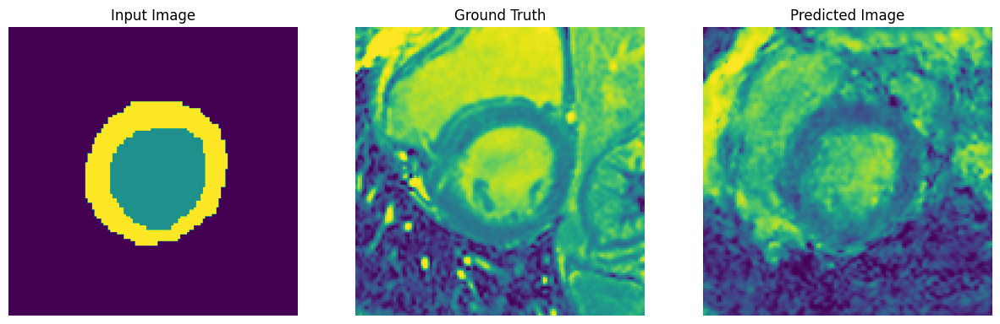

Step: 49k
....................................................................................................

In [ ]:
fit(train_dataset, test_dataset, steps=50000)

In [ ]:
ls {checkpoint_dir}

checkpoint                   ckpt-3.data-00000-of-00001  ckpt-6.index
ckpt-10.data-00000-of-00001  ckpt-3.index                ckpt-7.data-00000-of-00001
ckpt-10.index                ckpt-4.data-00000-of-00001  ckpt-7.index
ckpt-1.data-00000-of-00001   ckpt-4.index                ckpt-8.data-00000-of-00001
ckpt-1.index                 ckpt-5.data-00000-of-00001  ckpt-8.index
ckpt-2.data-00000-of-00001   ckpt-5.index                ckpt-9.data-00000-of-00001
ckpt-2.index                 ckpt-6.data-00000-of-00001  ckpt-9.index


In [ ]:
# Restoring the latest checkpoint in checkpoint_dir
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

Image value range: min=-1.0, max=-0.9843137264251709
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9896371364593506, max=0.9999997019767761


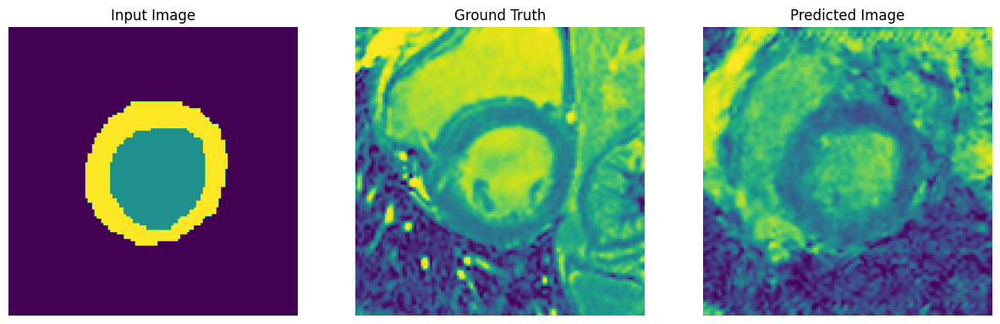

Image value range: min=-1.0, max=-0.9843137264251709
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9921127557754517, max=0.996604323387146


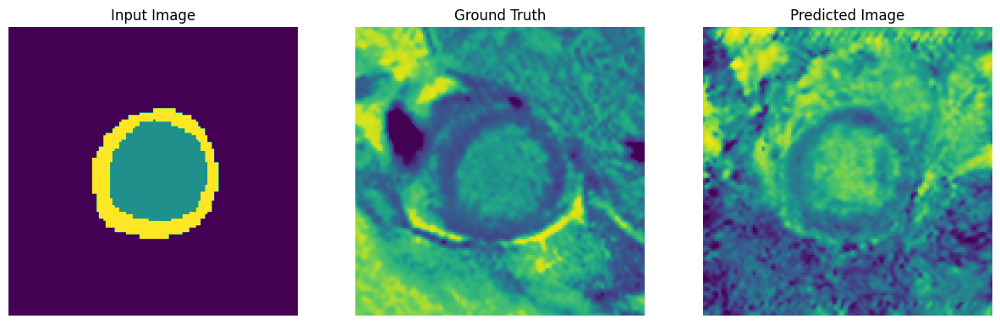

Image value range: min=-1.0, max=-0.9686274528503418
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9811844229698181, max=0.9961778521537781


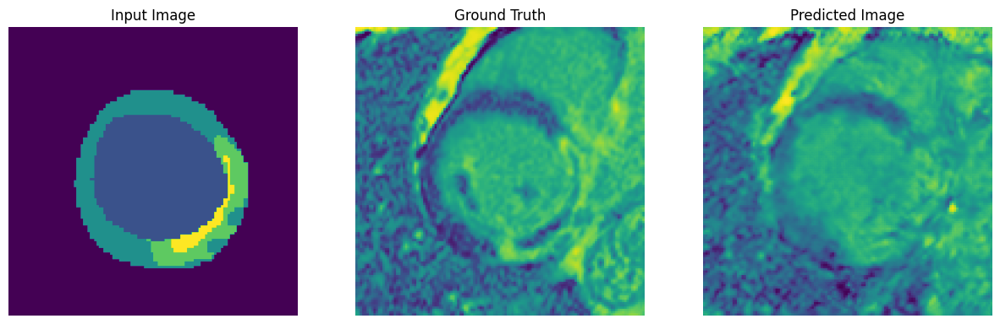

Image value range: min=-1.0, max=-0.9764705896377563
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9983025789260864, max=0.9999975562095642


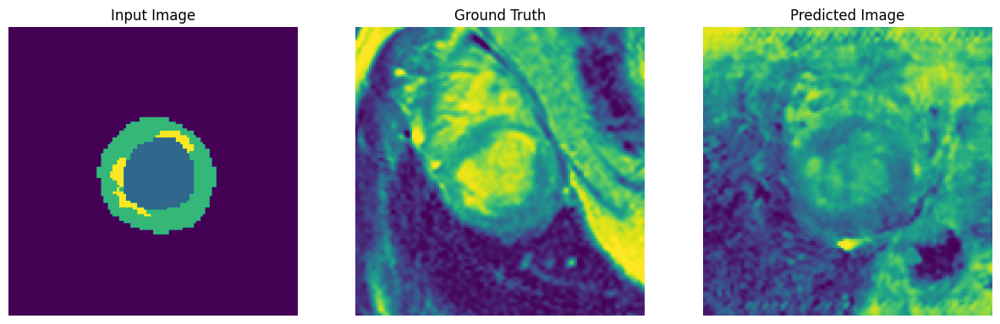

Image value range: min=-1.0, max=-0.9843137264251709
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9928494691848755, max=0.9978615045547485


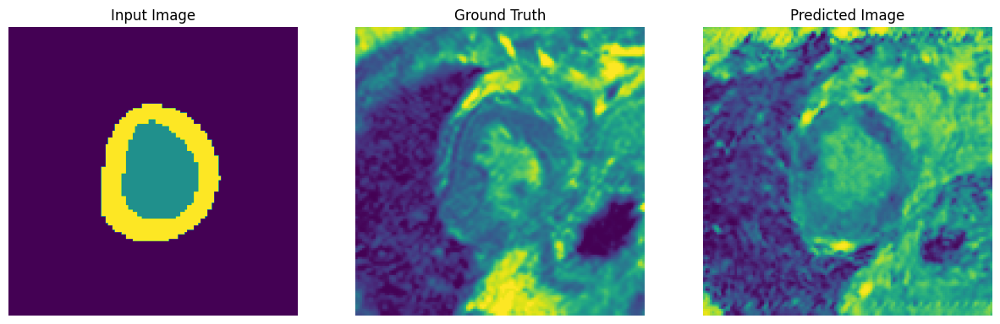

Image value range: min=-1.0, max=-0.9843137264251709
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9990696310997009, max=0.9999173283576965


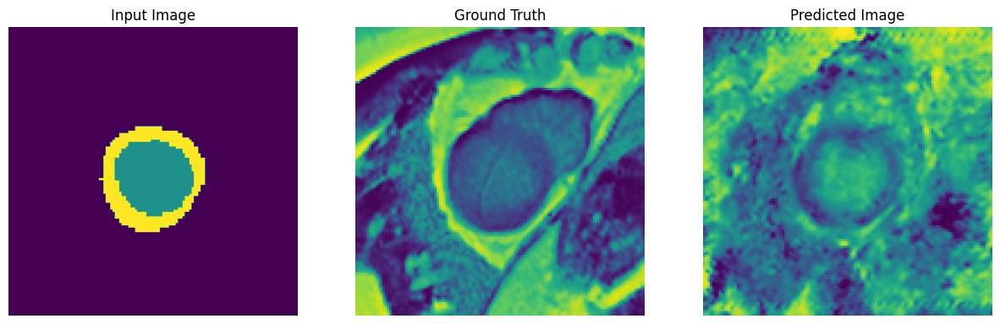

Image value range: min=-1.0, max=-0.9686274528503418
Image value range: min=-1.0, max=1.0
Image value range: min=-1.0, max=0.996947169303894


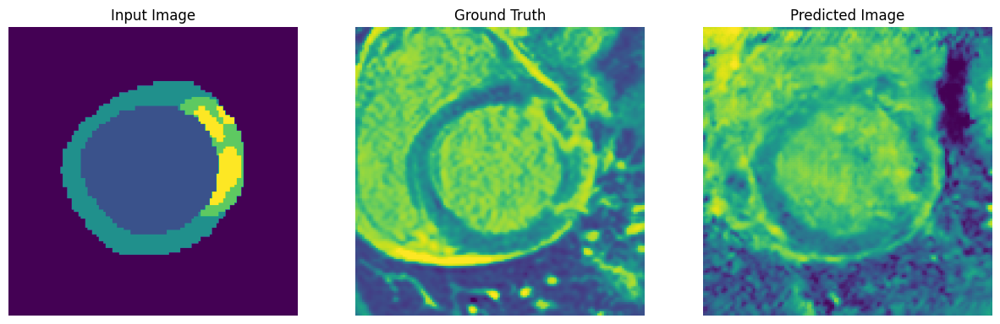

Image value range: min=-1.0, max=-0.9764705896377563
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9988188147544861, max=0.9997020363807678


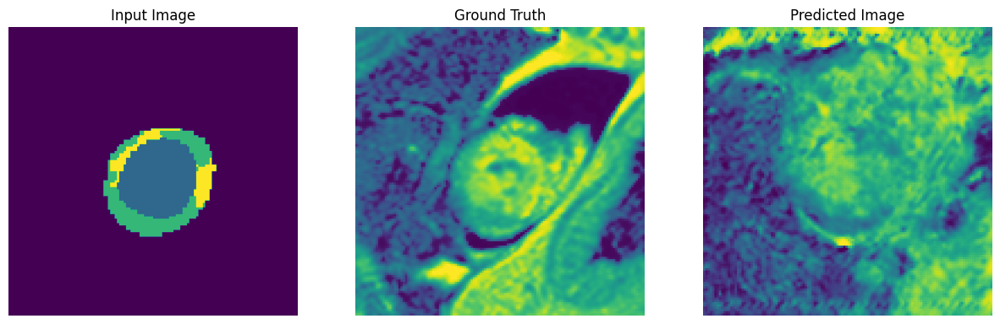

Image value range: min=-1.0, max=-0.9764705896377563
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9915479421615601, max=0.9997440576553345


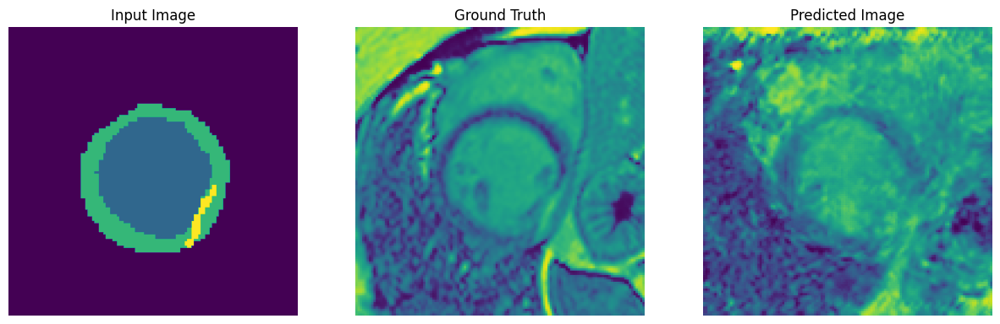

Image value range: min=-1.0, max=-0.9764705896377563
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9971685409545898, max=0.9999858736991882


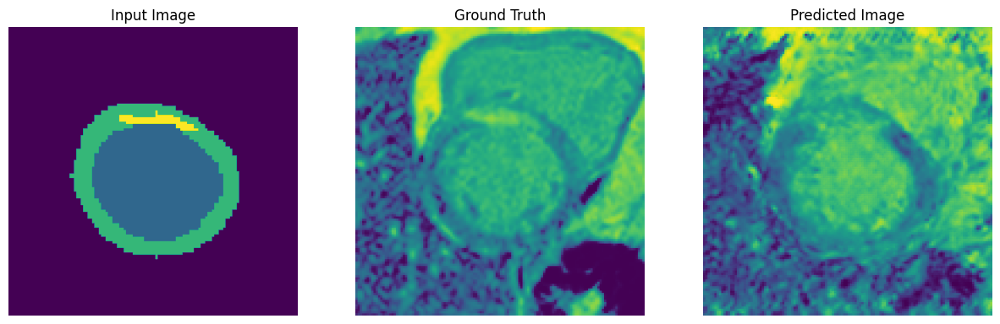

Image value range: min=-1.0, max=-0.9764705896377563
Image value range: min=-1.0, max=1.0
Image value range: min=-0.998031735420227, max=1.0


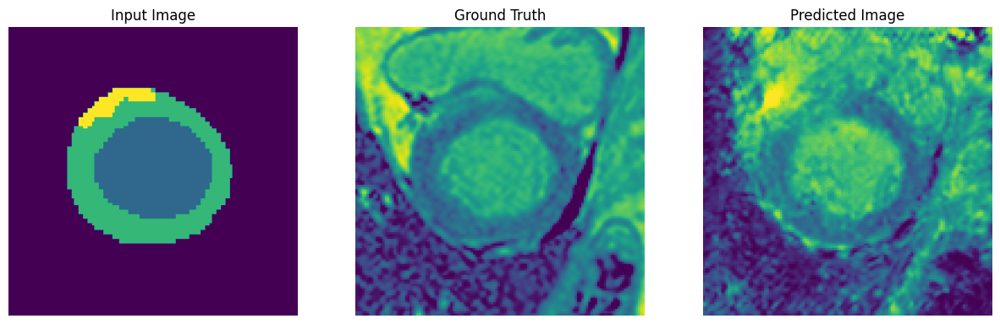

Image value range: min=-1.0, max=-0.9843137264251709
Image value range: min=-1.0, max=1.0
Image value range: min=-0.999688982963562, max=0.9999897480010986


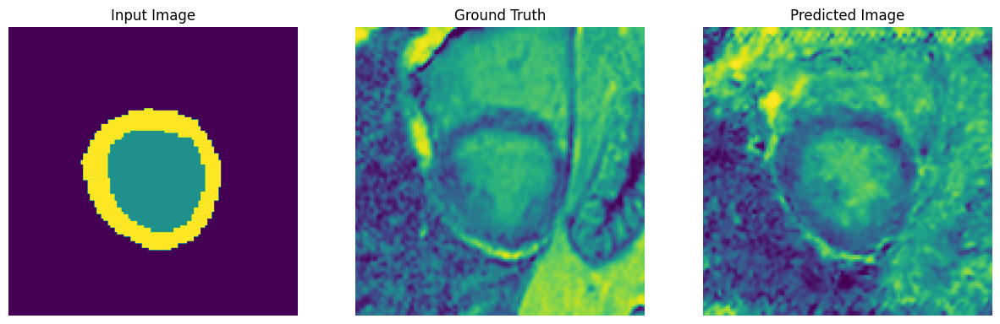

Image value range: min=-1.0, max=-0.9843137264251709
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9945945739746094, max=0.9999238848686218


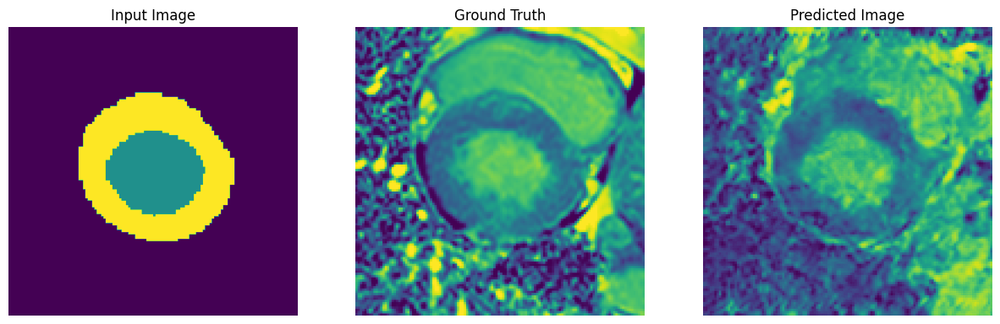

Image value range: min=-1.0, max=-0.9686274528503418
Image value range: min=-1.0, max=1.0
Image value range: min=-0.999426543712616, max=0.9885529279708862


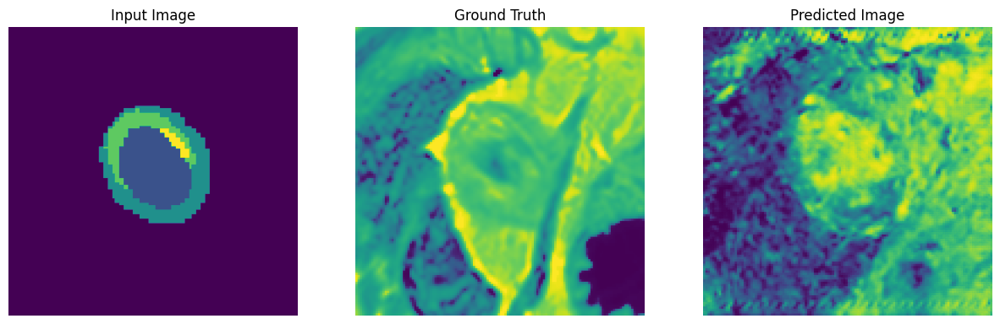

Image value range: min=-1.0, max=-0.9843137264251709
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9970839023590088, max=1.0


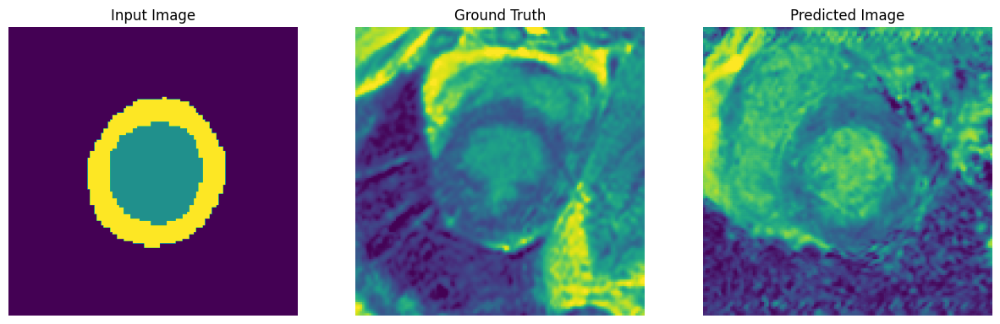

Image value range: min=-1.0, max=-0.9764705896377563
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9999993443489075, max=0.9874010682106018


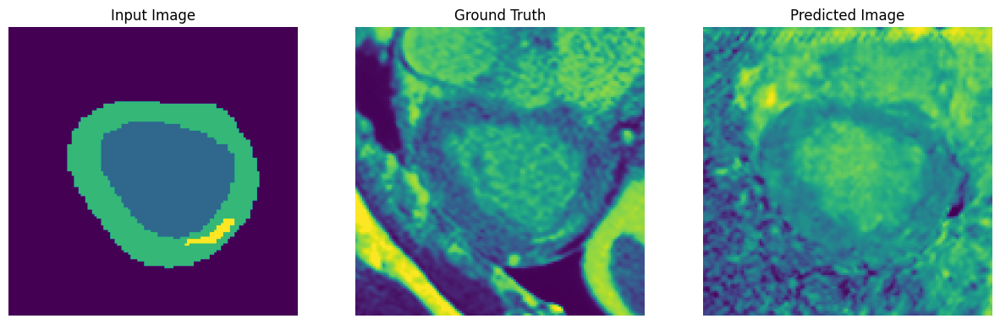

Image value range: min=-1.0, max=-0.9764705896377563
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9985247254371643, max=0.9999949336051941


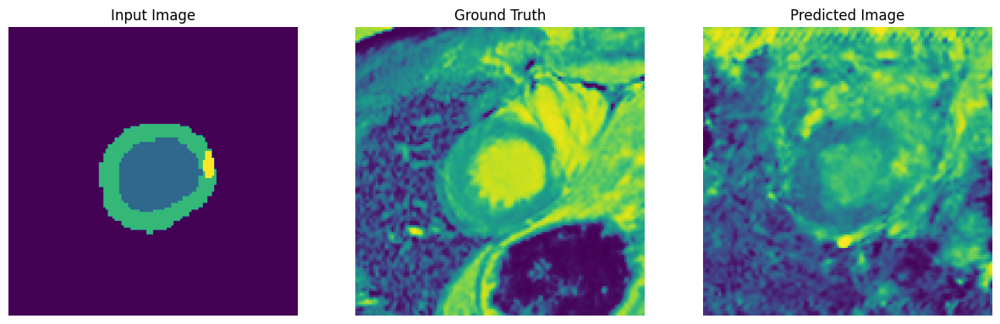

Image value range: min=-1.0, max=-0.9843137264251709
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9979248046875, max=0.9999876022338867


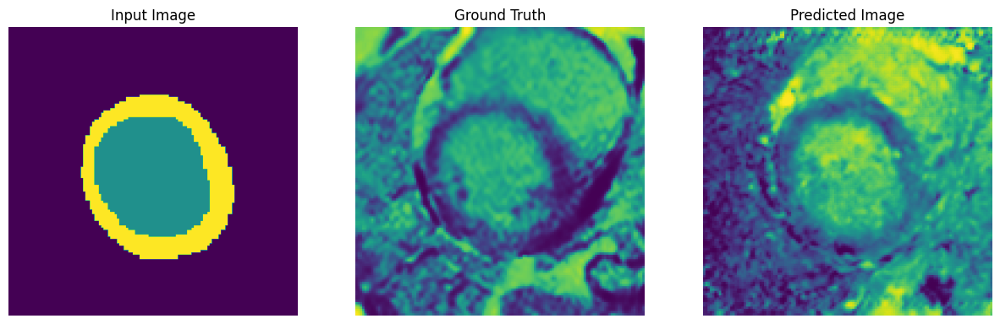

Image value range: min=-1.0, max=-0.9843137264251709
Image value range: min=-1.0, max=1.0
Image value range: min=-0.9989222288131714, max=0.9984169006347656


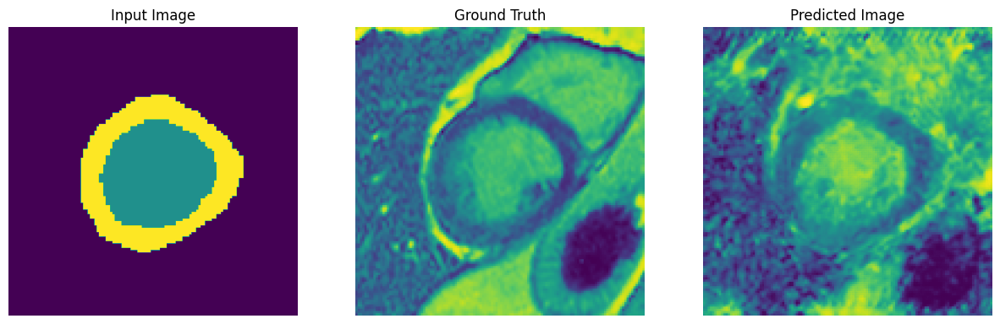

Image value range: min=-1.0, max=-0.9686274528503418
Image value range: min=-1.0, max=1.0
Image value range: min=-1.0, max=0.9953099489212036


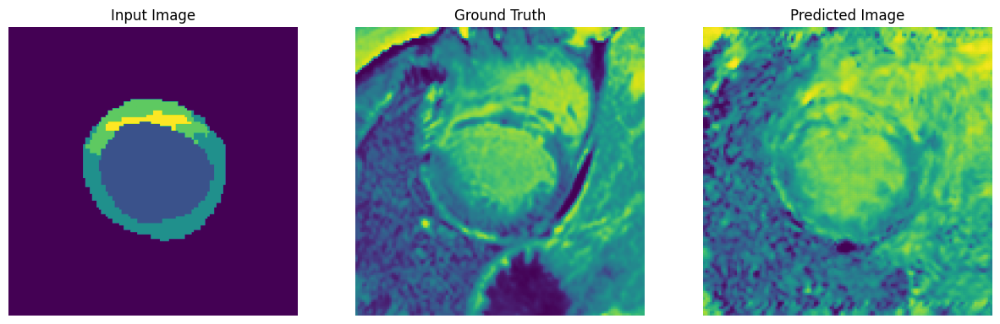

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(20):
  generate_images(generator, inp, tar)

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/training_checkpoints'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")


In [ ]:
generator.save('/content/drive/MyDrive/generator_model.h5')
discriminator.save('/content/drive/MyDrive/discriminator_model.h5')


In [ ]:
drive_checkpoint_dir = '/content/drive/MyDrive/training_checkpoints'
os.makedirs(drive_checkpoint_dir, exist_ok=True)

In [ ]:
import shutil
source_checkpoint_dir = '/content/myData/training_checkpoints'
destination_checkpoint_dir = '/content/drive/MyDrive/training_checkpoints'

# Copy the entire directory
shutil.copytree(source_checkpoint_dir, destination_checkpoint_dir, dirs_exist_ok=True)
print(f"Checkpoints saved to: {destination_checkpoint_dir}")

Checkpoints saved to: /content/drive/MyDrive/training_checkpoints
